In [5]:
import tensorflow as tf



# GPU 디바이스 목록 가져오기

gpus = tf.config.experimental.list_physical_devices('GPU')

if gpus:
    print("사용 가능한 GPU 디바이스:")
    for gpu in gpus:
        print("디바이스 이름:", gpu.name)
else:
    print("사용 가능한 GPU 디바이스가 없습니다.")

사용 가능한 GPU 디바이스:
디바이스 이름: /physical_device:GPU:0


In [35]:
###이미지 전처리 코드

import os
import numpy as np
import matplotlib.pyplot as plt
import random
import tensorflow as tf

# image_dir = "C:\\Users\\crazy\\Downloads\\archive\\img_align_celeba\\img_align_celeba"
# image_dir = "C:\\Users\\crazy\\Downloads\\archive\\img_align_celeba\\10000"
# image_dir = "C:\\Myfolder\\AI_tools\\dfl\\df_NVIDIA_RTX3000_series\\workspace\\data_src\\aligned"
# image_dir = "C:\\Myfolder\\AI_tools\\sd.webui\\this\\fun\\image"
# image_dir = "C:\\Users\\crazy\Downloads\\archive\\img_align_celeba\\facesetav"
crop_width, crop_height = 1024, 1024  # 자를 크기
resize_width, resize_height = 256, 256  # 변경할 크기

# 이미지 목록 가져오기
image_files = os.listdir(image_dir)

# # 이미지를 NumPy 배열로 로드하고 중앙에서 자르고 크기 변경하기
# images = []
# for filename in image_files:
#     img = tf.keras.preprocessing.image.load_img(os.path.join(image_dir, filename))
#     img = tf.keras.preprocessing.image.img_to_array(img)
#     img = img / 255.0  # 이미지 정규화

#     # 중앙에서 자르기
#     center_x = img.shape[1] // 2
#     center_y = img.shape[0] // 2
#     half_width = crop_width // 2
#     half_height = crop_height // 2
#     cropped_img = img[center_y - half_height:center_y + half_height, center_x - half_width:center_x + half_width, :]

#     # 크기 변경
#     resized_img = tf.image.resize(cropped_img, (resize_width, resize_height))

#     images.append(resized_img)

# 이미지를 NumPy 배열로 로드하고 크기 변경하기
images = []
for filename in image_files:
    img = tf.keras.preprocessing.image.load_img(os.path.join(image_dir, filename), target_size=(resize_width, resize_height))
    img = tf.keras.preprocessing.image.img_to_array(img)
    img = img / 255.0  # 이미지 정규화
    images.append(img)
images = np.array(images)


# 이미지 중에서 무작위로 하나 선택
random_index = random.randint(0, len(images) - 1)
selected_image = images[random_index]

KeyboardInterrupt: 

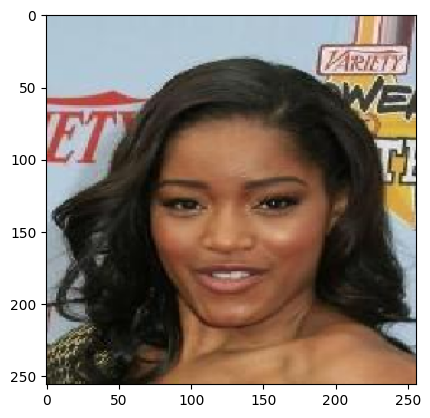

In [ ]:
# 선택한 이미지 표시
plt.imshow(selected_image)
plt.show()

In [8]:
keras = tf.keras
K = tf.keras.backend

class Sampling(keras.layers.Layer):
    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = K.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon
#인코더 부분
encoder_input = keras.layers.Input(shape=(resize_width, resize_height, 3), name="encoder_input")
x = keras.layers.Conv2D(32, (3, 3), strides=2, activation="relu", padding="same")(encoder_input)
x = keras.layers.Conv2D(64, (3, 3), strides=2, activation="relu", padding="same")(x)
x = keras.layers.Conv2D(128, (3, 3), strides=2, activation="relu", padding="same")(x)
shape_before_flattening = K.int_shape(x)[1:]
x = keras.layers.Flatten()(x)
z_mean = keras.layers.Dense(2, name="z_mean")(x)
z_log_var = keras.layers.Dense(2, name="z_log_var")(x)
z = Sampling()([z_mean, z_log_var])
encoder = keras.models.Model(encoder_input, [z_mean, z_log_var, z], name="encoder")

#디코더 부분
decoder_input = keras.layers.Input(shape=(2,), name="decoder_input")
x = keras.layers.Dense(np.prod(shape_before_flattening))(decoder_input)
x = keras.layers.Reshape(shape_before_flattening)(x)
x = keras.layers.Conv2DTranspose(128, (3, 3), strides=2, activation = 'relu', padding="same")(x)
x = keras.layers.Conv2DTranspose(64, (3, 3), strides=2, activation = 'relu', padding="same")(x)
x = keras.layers.Conv2DTranspose(32, (3, 3), strides=2, activation = 'relu', padding="same")(x)
decoder_output = keras.layers.Conv2D(3,(3, 3),strides = 1, activation="sigmoid", padding="same", name="decoder_output")(x)
decoder = keras.models.Model(decoder_input, decoder_output)

In [9]:

class VAE(keras.models.Model):
    def __init__(self, encoder, decoder, **kwargs):
        super(VAE, self).__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder

        #loss 값을 모니터링 하는 요소
        self.total_loss_tracker = keras.metrics.Mean(name='total_loss')
        self.reconstruction_loss_tracker = keras.metrics.Mean(name="reconstruction_loss")
        self.kl_loss_tracker = keras.metrics.Mean(name="kl_loss")

    @property
    def metrics(self):
        return [
            self.total_loss_tracker,
            self.reconstruction_loss_tracker,
            self.kl_loss_tracker,
        ]
    
    def call(self, input):
        z_mean, z_log_var, z = encoder(input)
        reconstruction = decoder(z)
        return z_mean, z_log_var, reconstruction
    
    def train_step(self, data):
        with tf.GradientTape() as tape:
            z_mean, z_log_var, reconstruction = self(data)
            reconstruction_loss = tf.reduce_mean(500 * tf.losses.binary_crossentropy(data, reconstruction, axis=(1,2,3)))
            kl_loss = tf.reduce_mean(tf.reduce_sum(-0.5 * (1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var)), axis=1))
            total_loss = reconstruction_loss + kl_loss
        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        self.total_loss_tracker.update_state(total_loss)
        self.reconstruction_loss_tracker.update_state(reconstruction_loss)
        self.kl_loss_tracker.update_state(kl_loss)

        return {m.name: m.result() for m in self.metrics}

In [10]:
#모델 새로 정의할때
vae = VAE(encoder, decoder)

In [11]:
# 모델 불러오기
load_model = tf.keras.models.load_model('vae_model')

vae.set_weights(load_model.get_weights())

In [30]:
#모델 훈련하기

vae.compile(optimizer="adam")
vae.fit(images, epochs=100, batch_size=10)

Epoch 1/100
300/300 [==============================] - 14s 44ms/step - total_loss: 299.7367 - reconstruction_loss: 296.2844 - kl_loss: 3.4523
Epoch 2/100
300/300 [==============================] - 13s 44ms/step - total_loss: 299.7119 - reconstruction_loss: 296.1991 - kl_loss: 3.5129
Epoch 3/100
300/300 [==============================] - 13s 44ms/step - total_loss: 299.5837 - reconstruction_loss: 296.0789 - kl_loss: 3.5048
Epoch 4/100
300/300 [==============================] - 13s 44ms/step - total_loss: 299.6181 - reconstruction_loss: 296.1052 - kl_loss: 3.5130
Epoch 5/100
300/300 [==============================] - 13s 44ms/step - total_loss: 299.4066 - reconstruction_loss: 295.9290 - kl_loss: 3.4775
Epoch 6/100
300/300 [==============================] - 13s 44ms/step - total_loss: 299.4972 - reconstruction_loss: 295.9915 - kl_loss: 3.5057
Epoch 7/100
300/300 [==============================] - 13s 45ms/step - total_loss: 299.3227 - reconstruction_loss: 295.8077 - kl_loss: 3.5152
Epoch 

In [31]:
#모델 저장

vae.save('vae_model')

INFO:tensorflow:Assets written to: vae_model\assets


INFO:tensorflow:Assets written to: vae_model\assets


(25, 2)
1/1 [==============================] - 1s 1s/step


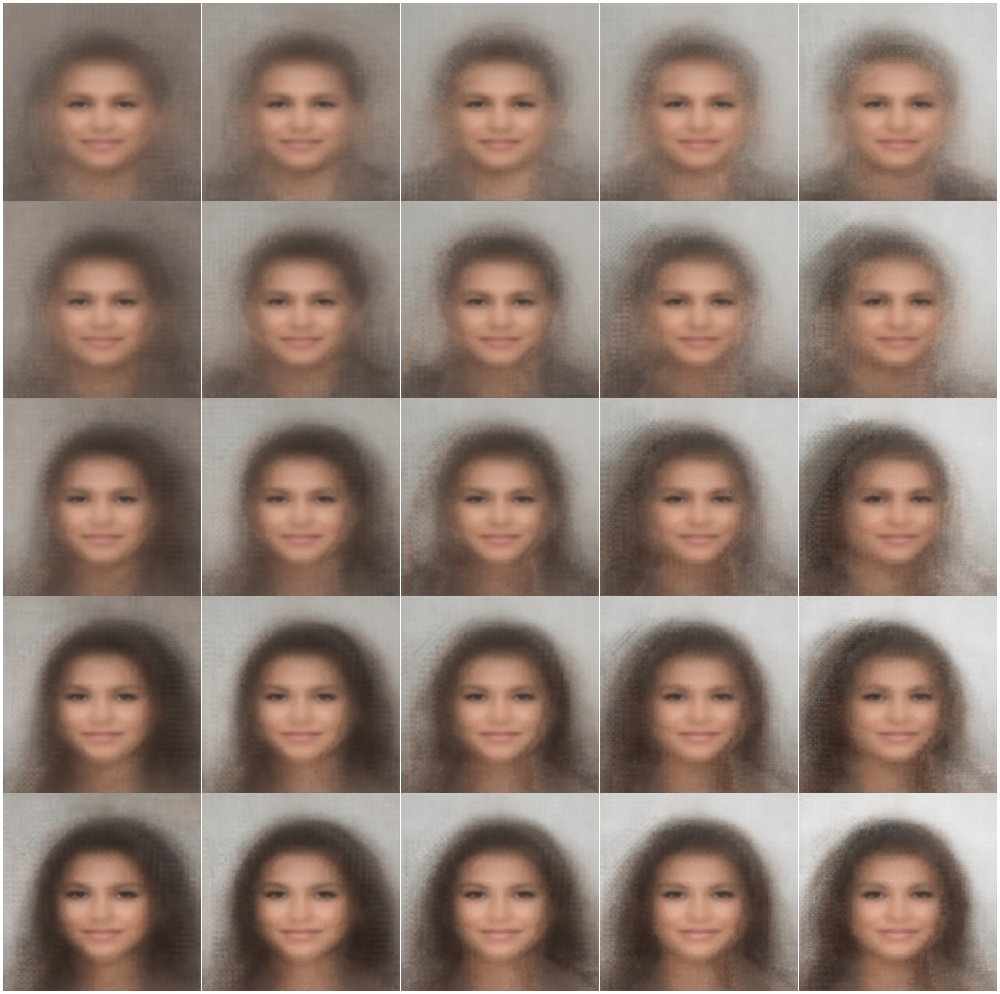

In [34]:
z_sample = []
ie = 5
je = 5

for i in range(ie):
    for j in range(je):
        z_sample.append([i * 0.3, j * 0.3])

z_sample = np.array(z_sample)
print(z_sample.shape)

reconstructions = decoder.predict(z_sample)
fig = plt.figure(figsize=(40, 40))
fig.subplots_adjust(hspace=0.0, wspace=0.0)
for i in range(ie * je):
    ax = fig.add_subplot(ie, je, i + 1)
    ax.axis("off")
    ax.imshow(reconstructions[i, :, :])

In [ ]:
# # 생성한 "z_sample" 배열
# z_sample = []
# ie = 100
# je = 100

# for i in range(ie):
#     for j in range(je):
#         z_sample.append([i * 0.3, j * 0.3])

# z_sample = np.array(z_sample)

# # 디코더로부터 재구성된 이미지 생성
# reconstructions = decoder.predict(z_sample)

# # 이미지 저장
# save_dir = "image_output/"
# if not os.path.exists(save_dir):
#     os.makedirs(save_dir)

# for i in range(ie * je):
#     image_filename = os.path.join(save_dir, f"image_{i}.png")
#     plt.imsave(image_filename, reconstructions[i, :, :])

# print("Images saved successfully.")